In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

import joblib




In [2]:
import pandas as pd
import sys
sys.path.append('c:/users/shubh/programming_work/virtual_envs/genai_exp_env/lib/site-packages')


In [3]:
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns


In [4]:
df_final_aggregated = pd.read_csv("df_final_aggregated.csv")

In [5]:
df_final_aggregated.head()

,Unnamed: 0,spotify_id,Love and Relationships,Self-Reflection and Personal Struggles,Social and Political Themes,Celebration and Fun,Philosophical and Existential,Storytelling and Narrative,Escape and Fantasy,Spiritual and Religious,Cultural and Lifestyle,Fun and Humor,Humor and Memes,Appreciation and Praise,Words of encouragement,Words of empathy,Personal Stories and Experiences,Nostalgia and Memories,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Url_youtube,Title,id,lyrics,youtube_video_id,video_id
0,0,0d28khcov6AiegSCpG5TuT,0,0,0,1,0,0,1,0,0,0,3,7,1,1,1,8,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),0d28khcov6AiegSCpG5TuT,"Feel good\n Sha, sha-ba-da, sha-ba-da-ca, feel...",HyHNuVaZJ-k,HyHNuVaZJ-k
1,1,1foMv2HQwfQ2vntFf9HFeG,0,0,0,0,1,1,1,0,0,0,9,6,1,1,0,5,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,1foMv2HQwfQ2vntFf9HFeG,I'm a scary gargoyle on a tower\n That you mad...,yYDmaexVHic,yYDmaexVHic
2,2,64dLd6rVqDLtkXFYrEUHIU,0,1,0,0,0,1,1,0,0,0,3,10,0,1,1,8,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,64dLd6rVqDLtkXFYrEUHIU,But in the magic cove\n There's a pretty one\n...,qJa-VFwPpYA,qJa-VFwPpYA
3,3,0q6LuUqGLUiCPP1cbdwFs3,1,1,0,0,0,0,1,0,0,0,6,7,0,2,1,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,https://www.youtube.com/watch?v=04mfKJWDSzI,Gorillaz - On Melancholy Hill (Official Video),0q6LuUqGLUiCPP1cbdwFs3,Up on Melancholy Hill\n There's a plastic tree...,04mfKJWDSzI,04mfKJWDSzI
4,4,7yMiX7n9SBvadzox8T5jzT,0,0,0,1,1,1,0,0,0,0,5,7,1,1,5,7,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,https://www.youtube.com/watch?v=1V_xRb0x9aw,Gorillaz - Clint Eastwood (Official Video),7yMiX7n9SBvadzox8T5jzT,"I ain't happy, I'm feeling glad\n I got sunshi...",1V_xRb0x9aw,1V_xRb0x9aw


In [6]:
comment_categories = [

    "Humor and Memes",
    "Appreciation and Praise",
    "Words of empathy",
    "Personal Stories and Experiences"    
]

In [7]:
lyric_categories = [

    "Love and Relationships",
    "Self-Reflection and Personal Struggles",
    "Social and Political Themes",
    "Celebration and Fun",
    "Philosophical and Existential",
    "Storytelling and Narrative",
    "Escape and Fantasy",
    "Spiritual and Relgious",
    "Cultural and Lifestyle",
    "Fun and Humor"
]

In [8]:
spotify_attributes = [
    # "spotify_id",
    "Danceability",	
    "Energy",	
    "Key",	
    "Loudness",	
    "Speechiness",	
    "Acousticness",	
    "Instrumentalness",	
    "Liveness",	
    "Valence",	
    "Tempo",	
    "Duration_ms"

    
]

In [9]:
for col in df_final_aggregated.columns:
    print(col)

Unnamed: 0
spotify_id
Love and Relationships
Self-Reflection and Personal Struggles
Social and Political Themes
Celebration and Fun
Philosophical and Existential
Storytelling and Narrative
Escape and Fantasy
Spiritual and Religious
Cultural and Lifestyle
Fun and Humor
Humor and Memes
Appreciation and Praise
Words of encouragement
Words of empathy
Personal Stories and Experiences
Nostalgia and Memories
Artist
Url_spotify
Track
Album
Album_type
Uri
Danceability
Energy
Key
Loudness
Speechiness
Acousticness
Instrumentalness
Liveness
Valence
Tempo
Duration_ms
Url_youtube
Title
id
lyrics
youtube_video_id
video_id


In [10]:
X = df_final_aggregated[ spotify_attributes ]

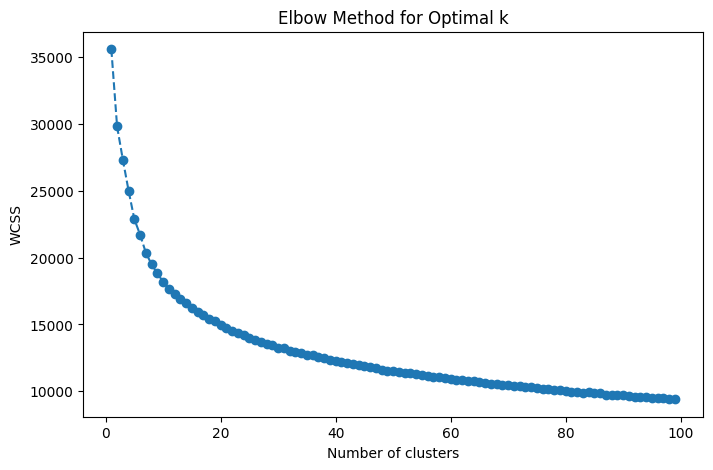

In [11]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Elbow Method to determine optimal number of clusters
wcss = []  # Within-cluster sum of squares
K_range = range(1, 100)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot Elbow Method graph
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method for Optimal k')
plt.show()

In [12]:
len(df_final_aggregated)

3235

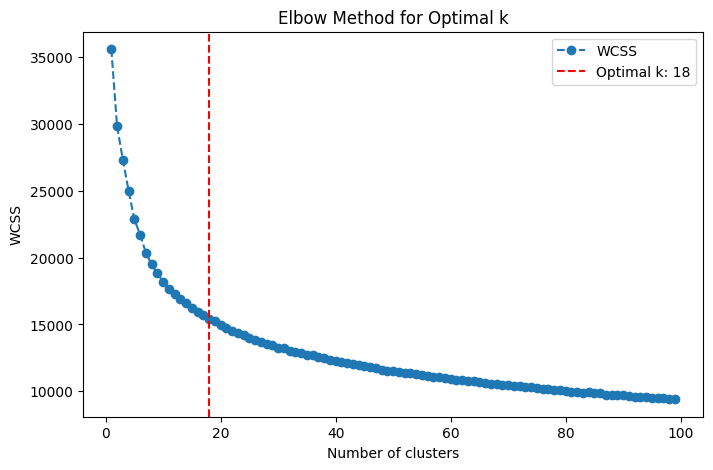

In [13]:
from kneed import KneeLocator
# Use KneeLocator to automatically find the elbow point
knee_locator = KneeLocator(K_range, wcss, curve="convex", direction="decreasing")
optimal_k = knee_locator.elbow

# Plot Elbow Method graph
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='--', label="WCSS")
plt.axvline(optimal_k, color='r', linestyle='--', label=f'Optimal k: {optimal_k}')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method for Optimal k')
plt.legend()
plt.show()


In [14]:
optimal_k

np.int64(18)

In [15]:
optimal_k = 7

In [16]:
# Fit K-Means with optimal k
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_scaled)

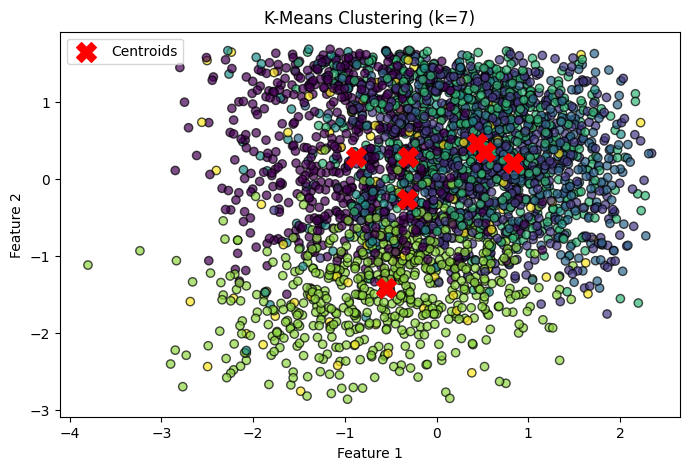

In [17]:
# Plot the clustered data
plt.figure(figsize=(8, 5))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels, cmap='viridis', edgecolors='k', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red', marker='X', label='Centroids')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title(f'K-Means Clustering (k={optimal_k})')
plt.legend()
plt.show()

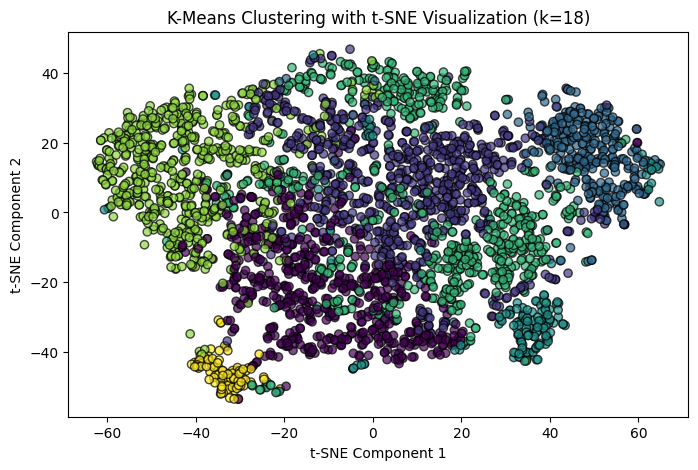

In [18]:
# Reduce dimensions using t-SNE
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Plot the clustered data using t-SNE
plt.figure(figsize=(8, 5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis', edgecolors='k', alpha=0.7)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('K-Means Clustering with t-SNE Visualization (k=18)')
plt.show()

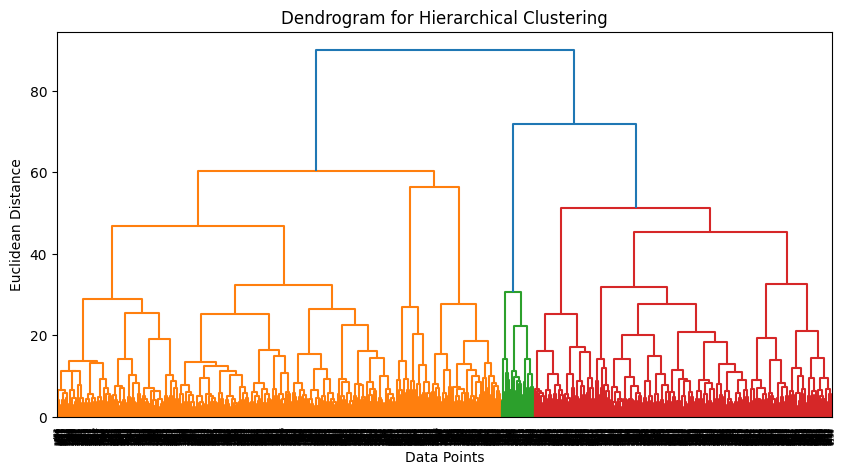

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

# Assume X_scaled is the preprocessed data

# Plot Dendrogram to determine optimal clusters
plt.figure(figsize=(10, 5))
linkage_matrix = sch.linkage(X_scaled, method='ward')
sch.dendrogram(linkage_matrix)
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.title('Dendrogram for Hierarchical Clustering')
plt.show()



In [20]:
labels

array([3, 1, 4, ..., 4, 5, 5], shape=(3235,), dtype=int32)

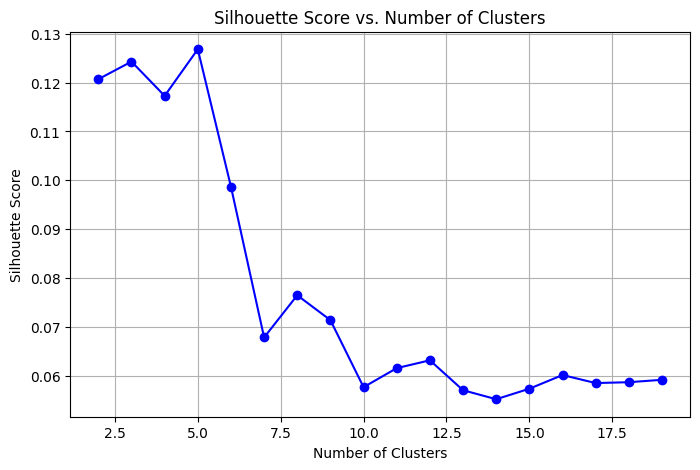

In [21]:
# Define range of cluster sizes to evaluate
cluster_range = range(2, 20)  # Varying from 2 to 10 clusters
silhouette_scores = []

# Compute silhouette score for different cluster sizes
for n_clusters in cluster_range:
    agg_cluster = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = agg_cluster.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(score)

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs. Number of Clusters")
plt.grid(True)
plt.show()

In [22]:
# # Perform Hierarchical Clustering with k=18
# n_clusters = 5
# agglo = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
# labels = agglo.fit_predict(X_scaled)

# # Reduce dimensions using t-SNE
# tsne = TSNE(n_components=2, random_state=42)
# X_tsne = tsne.fit_transform(X_scaled)

# # Plot the clustered data using t-SNE
# plt.figure(figsize=(8, 5))
# plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis', edgecolors='k', alpha=0.7)
# plt.xlabel('t-SNE Component 1')
# plt.ylabel('t-SNE Component 2')
# plt.title('Hierarchical Clustering with t-SNE Visualization (k=18)')
# plt.show()

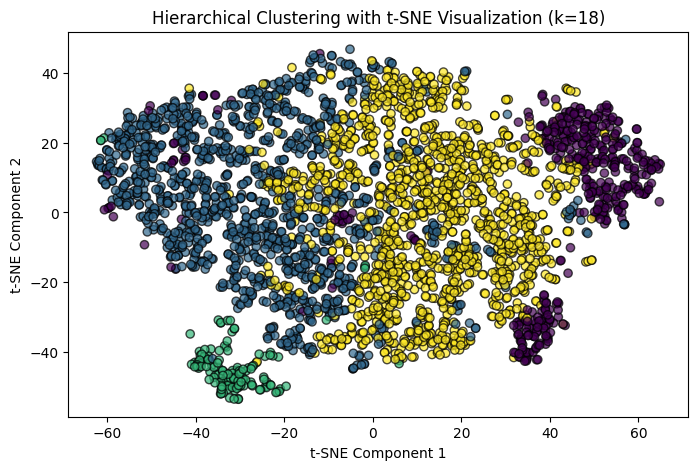

In [23]:
# Perform Hierarchical Clustering with k=18
n_clusters = 4
agglo = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
labels = agglo.fit_predict(X_scaled)

# Reduce dimensions using t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Plot the clustered data using t-SNE
plt.figure(figsize=(8, 5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis', edgecolors='k', alpha=0.7)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('Hierarchical Clustering with t-SNE Visualization (k=18)')
plt.show()

In [24]:
X_scaled_df = pd.DataFrame(X_scaled, columns = spotify_attributes )
X_scaled_df['cluster'] = labels

In [25]:
# from pandas.plotting import parallel_coordinates
# import matplotlib.pyplot as plt

# plt.figure(figsize=(12,6))
# parallel_coordinates(X_scaled_df, class_column="cluster", cols=spotify_attributes, colormap=plt.get_cmap("Set1"))
# plt.title("Parallel Coordinates Plot of Clusters")
# plt.xticks(rotation=45)
# plt.show()

# # X_scaled


In [26]:
# import seaborn as sns
# fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))
# for idx, feature in enumerate(spotify_attributes):  # 상위 6개 feature만 시각화
#     sns.boxplot(x="cluster", y=feature, data=X_scaled_df, ax=axes[idx//3, idx%3], palette="Set2")
#     axes[idx//3, idx%3].set_title(f"Distribution of {feature} Across Clusters")
# plt.tight_layout()
# plt.show()

In [27]:
X['cluster'] = labels

C:\Users\shubh\AppData\Local\Temp\ipykernel_3680\111150740.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['cluster'] = labels


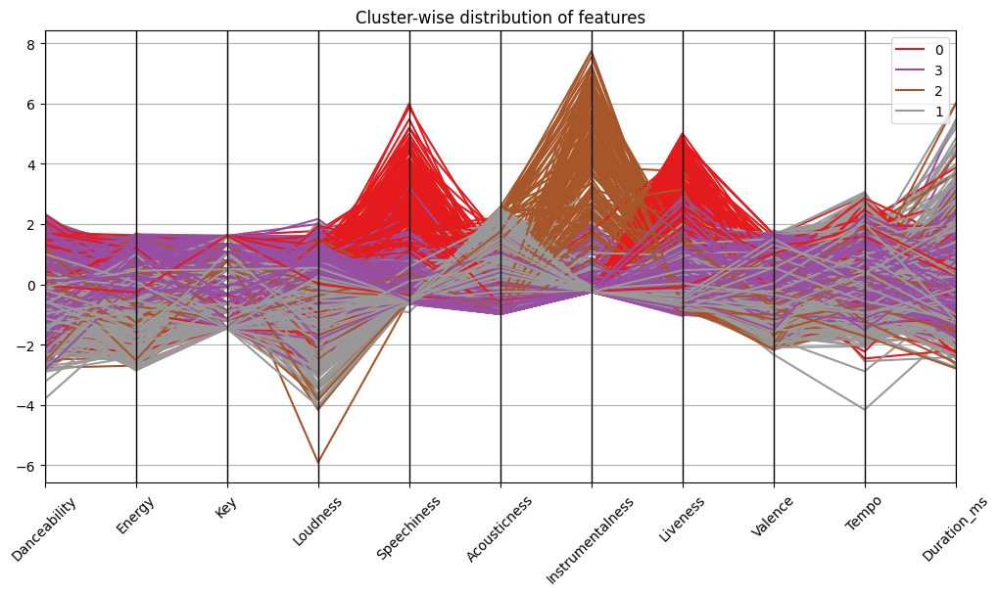

In [28]:
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
parallel_coordinates(X_scaled_df, class_column="cluster", cols=spotify_attributes, colormap=plt.get_cmap("Set1"))
# plt.title("Parallel Coordinates Plot of Clusters")
plt.title("Cluster-wise distribution of features")
plt.xticks(rotation=45)
plt.savefig("cluster_distribution_spotify_features.jpg", format="jpg", dpi=300, bbox_inches="tight")


plt.show()

### OBSERVATIONS

- Cluster 0 represents high concentrations of songs with 'Speechiness' and 'Liveness'
- Cluster 3 represents balanced distribution across all clusters.
- Cluster 2 represents high concentration of Instrumentalness
- Cluster 1 represents highest concentration of Acousticness


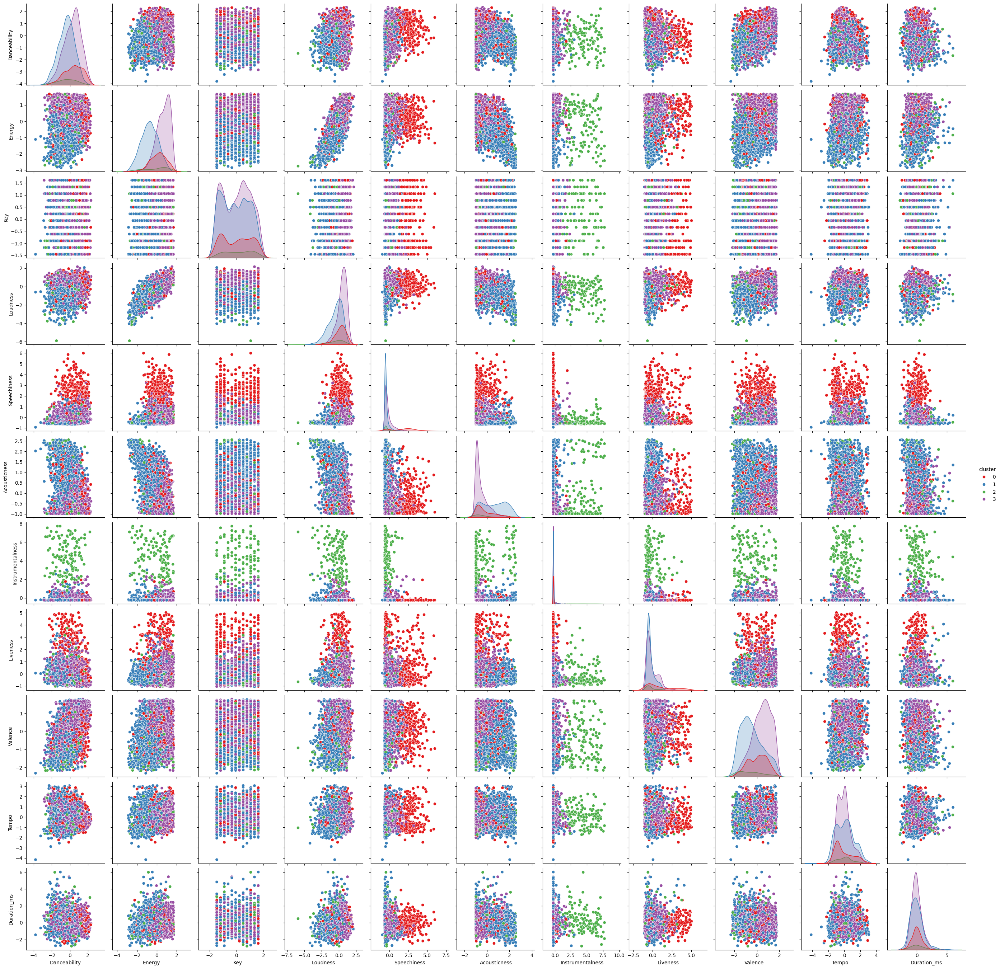

In [29]:
import seaborn as sns

sns.pairplot(X_scaled_df, hue="cluster", vars=spotify_attributes, palette="Set1")
plt.show()

In [30]:
X_scaled_df

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,cluster
0,1.355189,0.308004,0.218227,0.318709,1.148811,-0.956147,-0.225927,2.632401,0.879722,0.613216,-0.253452,0
1,0.460004,0.298517,0.776741,0.563969,-0.570165,-0.675509,-0.239515,-0.884116,1.211524,-0.964273,-0.606036,3
2,0.579782,1.342092,-1.178061,1.099058,-0.312553,-0.834158,0.142681,-0.451610,-0.036880,-0.438891,-0.370996,3
3,0.541957,0.469284,-0.898803,0.565389,-0.619346,-0.985964,3.964386,-0.774283,0.075103,-0.011469,-0.077262,2
4,0.378050,0.255825,1.335256,-0.234263,1.078553,-0.895617,-0.245196,-0.738292,-0.144716,1.625679,1.602767,0
5,0.989550,1.190299,1.614514,0.553466,-0.488198,-0.904193,0.473493,0.677746,1.684342,-0.016946,0.097453,3
6,0.712169,1.218761,-0.340288,0.175072,-0.187260,-0.943140,1.921622,0.845288,-0.837352,0.216106,0.554791,2
7,0.775210,0.829792,1.614514,0.543815,-0.557285,-0.957469,0.424698,-0.476431,-0.406010,0.668293,-0.458722,3
8,0.869772,1.294657,-0.898803,1.266539,-0.379298,-0.973762,0.606645,0.845288,0.344692,-0.025626,-0.392966,3
9,0.138494,1.123890,1.335256,0.177627,0.973166,-0.873463,0.425525,2.998511,1.265442,2.464161,-0.131263,3


C:\Users\shubh\AppData\Local\Temp\ipykernel_3680\1327776554.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="cluster", y=feature, data=X_scaled_df, ax=axes[idx//3, idx%3], palette="Set2")
C:\Users\shubh\AppData\Local\Temp\ipykernel_3680\1327776554.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="cluster", y=feature, data=X_scaled_df, ax=axes[idx//3, idx%3], palette="Set2")
C:\Users\shubh\AppData\Local\Temp\ipykernel_3680\1327776554.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="cluster", y=feature, data=X_scaled_df, ax=ax

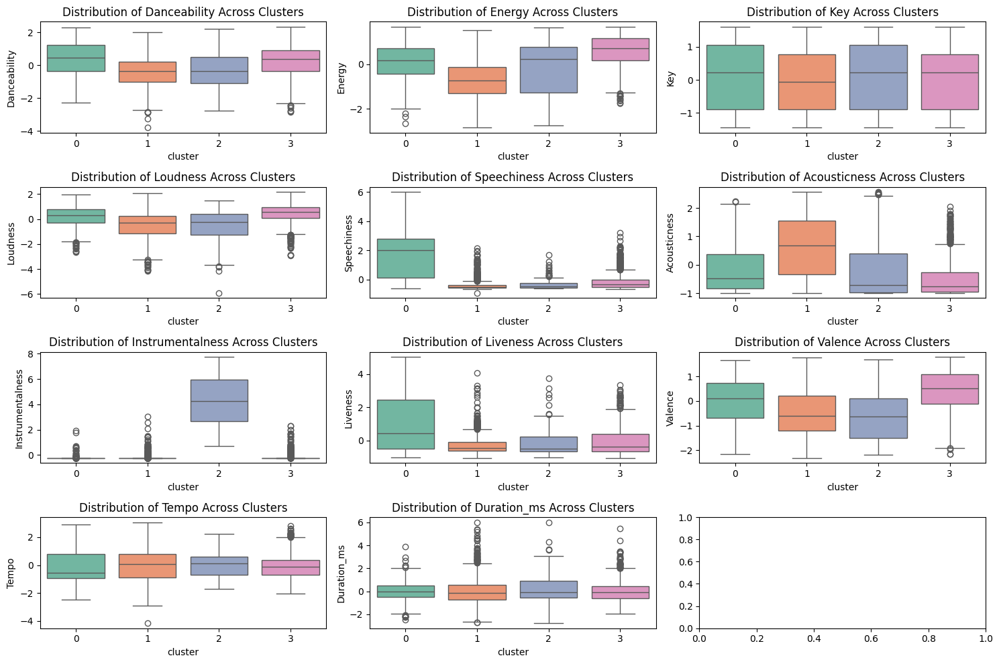

In [31]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))
for idx, feature in enumerate(spotify_attributes):  # 상위 6개 feature만 시각화
    sns.boxplot(x="cluster", y=feature, data=X_scaled_df, ax=axes[idx//3, idx%3], palette="Set2")
    axes[idx//3, idx%3].set_title(f"Distribution of {feature} Across Clusters")
plt.tight_layout()
plt.show()

In [32]:
X_scaled_df.head()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,cluster
0,1.355189,0.308004,0.218227,0.318709,1.148811,-0.956147,-0.225927,2.632401,0.879722,0.613216,-0.253452,0
1,0.460004,0.298517,0.776741,0.563969,-0.570165,-0.675509,-0.239515,-0.884116,1.211524,-0.964273,-0.606036,3
2,0.579782,1.342092,-1.178061,1.099058,-0.312553,-0.834158,0.142681,-0.451610,-0.036880,-0.438891,-0.370996,3
3,0.541957,0.469284,-0.898803,0.565389,-0.619346,-0.985964,3.964386,-0.774283,0.075103,-0.011469,-0.077262,2
4,0.378050,0.255825,1.335256,-0.234263,1.078553,-0.895617,-0.245196,-0.738292,-0.144716,1.625679,1.602767,0


In [33]:
df_final_aggregated[ spotify_attributes + ['spotify_id'] ]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,spotify_id
0,0.8180,0.7050,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.7720,138.559,222640.0,0d28khcov6AiegSCpG5TuT
1,0.6760,0.7030,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.8520,92.761,200173.0,1foMv2HQwfQ2vntFf9HFeG
2,0.6950,0.9230,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.5510,108.014,215150.0,64dLd6rVqDLtkXFYrEUHIU
3,0.6890,0.7390,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.5780,120.423,233867.0,0q6LuUqGLUiCPP1cbdwFs3
4,0.6630,0.6940,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.5250,167.953,340920.0,7yMiX7n9SBvadzox8T5jzT
5,0.7600,0.8910,11.0,-5.852,0.0372,0.022900,0.086900,0.2980,0.9660,120.264,245000.0,4Hff1IjRbLGeLgFgxvHflk
6,0.7160,0.8970,4.0,-7.185,0.0629,0.012000,0.262000,0.3250,0.3580,127.030,274142.0,2c3KCGq6UojB2c8UAFrRON
7,0.7260,0.8150,11.0,-5.886,0.0313,0.007990,0.081000,0.1120,0.4620,140.158,209560.0,3lIxtCaROdRDuTnNBDm3n2
8,0.7410,0.9130,2.0,-3.340,0.0465,0.003430,0.103000,0.3250,0.6430,120.012,213750.0,2W3ZpQg9i6lE6kmHbcdu9N
9,0.6250,0.8770,10.0,-7.176,0.1620,0.031500,0.081100,0.6720,0.8650,192.296,230426.0,2bfGNzdiRa1jXZRdfssSzR


In [34]:
id_column = df_final_aggregated['spotify_id']
X_scaled_df['spotify_id'] = id_column


In [37]:
X_scaled_df.to_csv("x_scaled_df_spotify.csv")

In [35]:
# Save the scaler object to a file
joblib.dump(scaler, 'scaler_spotify.pkl')


['scaler_spotify.pkl']

In [32]:
# Add '_scaled' to every column name in X_scaled_df
X_scaled_df.columns = [col if col in ['spotify_id', 'cluster'] else col + '_scaled' for col in X_scaled_df.columns]

# Merge the two DataFrames on 'spotify_id' using an inner join
merged_df = pd.merge(X_scaled_df, df_final_aggregated, on='spotify_id', how='inner')

# Now merged_df contains the inner join of both DataFrames with the scaled column names


In [33]:
merged_df.head()

,Danceability_scaled,Energy_scaled,Key_scaled,Loudness_scaled,Speechiness_scaled,Acousticness_scaled,Instrumentalness_scaled,Liveness_scaled,Valence_scaled,Tempo_scaled,Duration_ms_scaled,cluster,spotify_id,Unnamed: 0,Love and Relationships,Self-Reflection and Personal Struggles,Social and Political Themes,Celebration and Fun,Philosophical and Existential,Storytelling and Narrative,Escape and Fantasy,Spiritual and Religious,Cultural and Lifestyle,Fun and Humor,Humor and Memes,Appreciation and Praise,Words of encouragement,Words of empathy,Personal Stories and Experiences,Nostalgia and Memories,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Url_youtube,Title,id,lyrics,youtube_video_id,video_id
0,1.355189,0.308004,0.218227,0.318709,1.148811,-0.956147,-0.225927,2.632401,0.879722,0.613216,-0.253452,0,0d28khcov6AiegSCpG5TuT,0,0,0,0,1,0,0,1,0,0,0,3,7,1,1,1,8,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,-6.679,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),0d28khcov6AiegSCpG5TuT,"Feel good\n Sha, sha-ba-da, sha-ba-da-ca, feel...",HyHNuVaZJ-k,HyHNuVaZJ-k
1,0.460004,0.298517,0.776741,0.563969,-0.570165,-0.675509,-0.239515,-0.884116,1.211524,-0.964273,-0.606036,3,1foMv2HQwfQ2vntFf9HFeG,1,0,0,0,0,1,1,1,0,0,0,9,6,1,1,0,5,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,-5.815,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,1foMv2HQwfQ2vntFf9HFeG,I'm a scary gargoyle on a tower\n That you mad...,yYDmaexVHic,yYDmaexVHic
2,0.579782,1.342092,-1.178061,1.099058,-0.312553,-0.834158,0.142681,-0.451610,-0.036880,-0.438891,-0.370996,3,64dLd6rVqDLtkXFYrEUHIU,2,0,1,0,0,0,1,1,0,0,0,3,10,0,1,1,8,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,-3.930,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,64dLd6rVqDLtkXFYrEUHIU,But in the magic cove\n There's a pretty one\n...,qJa-VFwPpYA,qJa-VFwPpYA
3,0.541957,0.469284,-0.898803,0.565389,-0.619346,-0.985964,3.964386,-0.774283,0.075103,-0.011469,-0.077262,2,0q6LuUqGLUiCPP1cbdwFs3,3,1,1,0,0,0,0,1,0,0,0,6,7,0,2,1,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,-5.810,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,https://www.youtube.com/watch?v=04mfKJWDSzI,Gorillaz - On Melancholy Hill (Official Video),0q6LuUqGLUiCPP1cbdwFs3,Up on Melancholy Hill\n There's a plastic tree...,04mfKJWDSzI,04mfKJWDSzI
4,0.378050,0.255825,1.335256,-0.234263,1.078553,-0.895617,-0.245196,-0.738292,-0.144716,1.625679,1.602767,0,7yMiX7n9SBvadzox8T5jzT,4,0,0,0,1,1,1,0,0,0,0,5,7,1,1,5,7,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,-8.627,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,https://www.youtube.com/watch?v=1V_xRb0x9aw,Gorillaz - Clint Eastwood (Official Video),7yMiX7n9SBvadzox8T5jzT,"I ain't happy, I'm feeling glad\n I got sunshi...",1V_xRb0x9aw,1V_xRb0x9aw
